# Sales Prediction

## Exploratory Data Analysis (EDA) of Sales Data

## Import Libraries and Load Data

In [1]:
# Import important libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import os
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics

warnings.filterwarnings('ignore')

In [2]:
# Path to your Excel file
file_path = "Sales Data.xlsx"

# Specify Engine name
engine_name = "calamine"

# Create an ExcelFile object
excel_file = pd.ExcelFile(file_path, engine=engine_name)

# List all sheet names
sheet_names = excel_file.sheet_names

# Display the sheet names
print(sheet_names)

['_com.sap.ip.bi.xl.hiddensheet', '2022', '2023', '2024']


In [3]:
# Read the data for 2024
sales_data_2024 = pd.read_excel(file_path,sheet_name=sheet_names[3], engine=engine_name)
sales_data_2024.head()

,entity_group_fro_bpc,company_code,company_code_name,business_area,business_area_name,plant,plant_code,sales_organization,sales_organization_name,distribution_channel,...,customer,customer_name,sales_employee,sales_employee_name,fiscal_year,posting_period,fiscal_period,actual_cogs,actual_income_data,margin_all
0,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,112352,E868,2024,1,1.2024,742.7025,1411.800,669.0975
1,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,112642,E931,2024,1,1.2024,485.1315,838.500,353.3685
2,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,112642,E931,2024,2,2.2024,2163.0195,4257.812,2094.7925
3,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,112642,E931,2024,3,3.2024,1451.7720,2515.500,1063.7280
4,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,1025582667,C24269,112642,E931,2024,3,3.2024,5325.2100,10998.000,5672.7900


In [4]:
# Read the data for 2023
sales_data_2023 = pd.read_excel(file_path,sheet_name=sheet_names[2], engine=engine_name)
sales_data_2023.head()

,entity_group_fro_bpc,company_code,company_code_name,business_area,business_area_name,plant,plant_code,sales_organization,sales_organization_name,distribution_channel,...,customer,customer_name,sales_employee,sales_employee_name,fiscal_year,posting_period,fiscal_period,actual_cogs,actual_income_data,margin_all
0,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,103923,E2,2023,1,1.2023,2329.0200,2062.5,-266.5200
1,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,103923,E2,2023,3,3.2023,1672.4340,1452.0,-220.4340
2,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,1025510359,C2,103923,E2,2023,2,2.2023,44503.7625,45567.5,1063.7375
3,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,1026587864,C3,103923,E2,2023,1,1.2023,40657.9500,37136.0,-3521.9500
4,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,1042222155,C9187,103923,E2,2023,3,3.2023,9875.0340,9585.4,-289.6340


In [5]:
# Read the data for 2022
sales_data_2022 = pd.read_excel(file_path,sheet_name=sheet_names[1], engine=engine_name)
sales_data_2022.head()

,entity_group_fro_bpc,company_code,company_code_name,business_area,business_area_name,plant,plant_code,sales_organization,sales_organization_name,distribution_channel,...,customer,customer_name,sales_employee,sales_employee_name,fiscal_year,posting_period,fiscal_period,actual_cogs,actual_income_data,margin_all
0,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,1042638964,C1,107198,E1,2022,2,2.2022,674.670000,1518.0075,843.337500
1,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,103923,E2,2022,1,1.2022,953.346667,2145.0300,1191.683333
2,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,103923,E2,2022,2,2.2022,1617.786667,3640.0200,2022.233333
3,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,103923,E2,2022,3,3.2022,776.450000,1747.0125,970.562500
4,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,110426,E3,2022,3,3.2022,397.306667,893.9400,496.633333


In [6]:
# Append dataframes to create a unified dataframe
sales_data = pd.concat([sales_data_2024,sales_data_2023,sales_data_2022],axis=0).reset_index(drop=True)
sales_data.head()

,entity_group_fro_bpc,company_code,company_code_name,business_area,business_area_name,plant,plant_code,sales_organization,sales_organization_name,distribution_channel,...,customer,customer_name,sales_employee,sales_employee_name,fiscal_year,posting_period,fiscal_period,actual_cogs,actual_income_data,margin_all
0,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,112352,E868,2024,1,1.2024,742.7025,1411.800,669.0975
1,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,112642,E931,2024,1,1.2024,485.1315,838.500,353.3685
2,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,112642,E931,2024,2,2.2024,2163.0195,4257.812,2094.7925
3,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,0000089014,C1,112642,E931,2024,3,3.2024,1451.7720,2515.500,1063.7280
4,Zieme and Sons,2100,Zieme and Sons,2110,ZS-Weld Mesh,2110,2110,2100,AL GURG BUILDING SER,01,...,1025582667,C24269,112642,E931,2024,3,3.2024,5325.2100,10998.000,5672.7900


## Convert DataType and Fill Missing Values

In [7]:
# Check datatypes before converting it
sales_data.dtypes

entity_group_fro_bpc          object
company_code                  object
company_code_name             object
business_area                 object
business_area_name            object
plant                         object
plant_code                    object
sales_organization            object
sales_organization_name       object
distribution_channel          object
distribution_channel_name     object
wbs_element                   object
wbs_element_name              object
profit_center                 object
profit_center_name            object
material_group                object
sub_category                  object
material_group_1              object
brand                         object
material_group_2              object
category                      object
customer_group                object
customer_group_name           object
customer                      object
customer_name                 object
sales_employee                object
sales_employee_name           object
f

In [8]:
# Ensure fiscal_period is in datetime format with the correct format
sales_data['fiscal_period'] = pd.to_datetime(sales_data['fiscal_year'].astype(str) + '-' + sales_data['posting_period'].astype(str)) #, errors='coerce', format='%d/%m/%Y')

# Fill missing values with appropriate fill methods or constants
sales_data.fillna({'customer_group': 'Unknown', 'customer_group_name': 'Unknown'}, inplace=True)

# Convert columns to appropriate data types
sales_data['fiscal_year'] = sales_data['fiscal_year'].astype(int)
sales_data['posting_period'] = sales_data['posting_period'].astype(int)
sales_data['actual_income_data'] = sales_data['actual_income_data'].astype(float)
sales_data['actual_cogs'] = sales_data['actual_cogs'].astype(float)
sales_data['margin_all'] = sales_data['margin_all'].astype(float)

# Extract month from fiscal_period for monthly aggregation
sales_data['month'] = sales_data['fiscal_period'].dt.to_period('M')


## Aggregate performance metrics over time and plot a timeseries graph

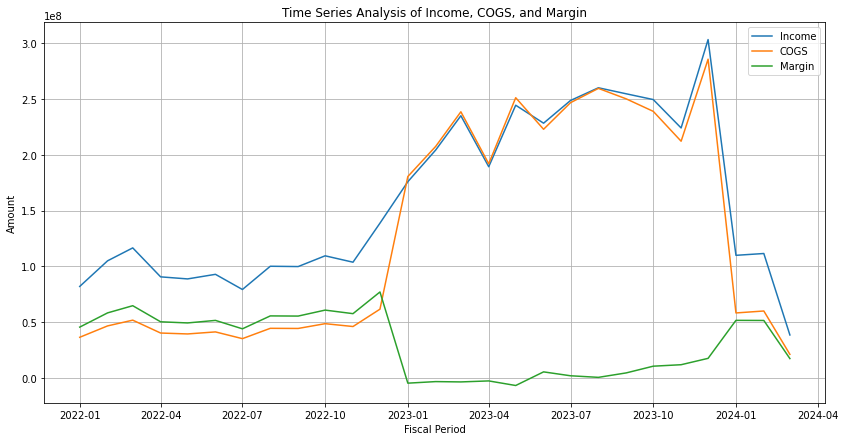

In [9]:
# Aggregate metrics over time
time_series_metrics = sales_data.groupby('fiscal_period').agg({
    'actual_income_data': 'sum',
    'actual_cogs': 'sum',
    'margin_all': 'sum'
}).sort_values(by='fiscal_period')

# Plot time series trends
plt.figure(figsize=(14, 7))
sns.lineplot(data=time_series_metrics, x=time_series_metrics.index, y='actual_income_data', label='Income')
sns.lineplot(data=time_series_metrics, x=time_series_metrics.index, y='actual_cogs', label='COGS')
sns.lineplot(data=time_series_metrics, x=time_series_metrics.index, y='margin_all', label='Margin')
plt.title('Time Series Analysis of Income, COGS, and Margin')
plt.xlabel('Fiscal Period')
plt.ylabel('Amount')
plt.legend()
plt.grid(True)
plt.show()


## Count the unique categories for each dimension

In [10]:
dimensions = ['distribution_channel_name', 'profit_center_name', 'customer_group_name', 'customer_name',
              'entity_group_fro_bpc', 'company_code_name', 'business_area_name',
              'brand', 'material_group_1', 'category', 'material_group_2', 'sub_category', 'material_group']

# Count the unique categories for each dimension
category_counts = {dim: sales_data[dim].nunique() for dim in dimensions}

# Sort the dimensions by the number of unique categories in ascending order
sorted_category_counts = dict(sorted(category_counts.items(), key=lambda item: item[1]))

# Print the number of unique categories for each dimension
for dim, count in sorted_category_counts.items():
    print(f'Number of unique categories for {dim}: {count}')


Number of unique categories for distribution_channel_name: 14
Number of unique categories for entity_group_fro_bpc: 24
Number of unique categories for company_code_name: 34
Number of unique categories for business_area_name: 42
Number of unique categories for customer_group_name: 49
Number of unique categories for profit_center_name: 203
Number of unique categories for category: 521
Number of unique categories for material_group_2: 526
Number of unique categories for brand: 830
Number of unique categories for material_group_1: 832
Number of unique categories for sub_category: 1066
Number of unique categories for material_group: 1103
Number of unique categories for customer_name: 26061


## Filtering list of dimensions to dimensions with limited categories

In [11]:
# Filtering list of dimensions to dimensions with limited categories
dimensions = ['distribution_channel_name', 'entity_group_fro_bpc', 'company_code_name', 'business_area_name', 'customer_group_name']

In [12]:
def aggregate_monthly_average_income(data, dimension, fiscal_year):
    filtered_data = data[data['fiscal_year'] == fiscal_year]
    monthly_avg = filtered_data.groupby([dimension, 'month'])['actual_income_data'].mean().reset_index()
    return monthly_avg.groupby(dimension)['actual_income_data'].mean().sort_values(ascending=False)

# Aggregate monthly average income data for each dimension and fiscal year
aggregated_income_data = {year: {dim: aggregate_monthly_average_income(sales_data, dim, year) for dim in dimensions} for year in sales_data['fiscal_year'].unique()}


## Plotting Average monthly income across categories in several dimension

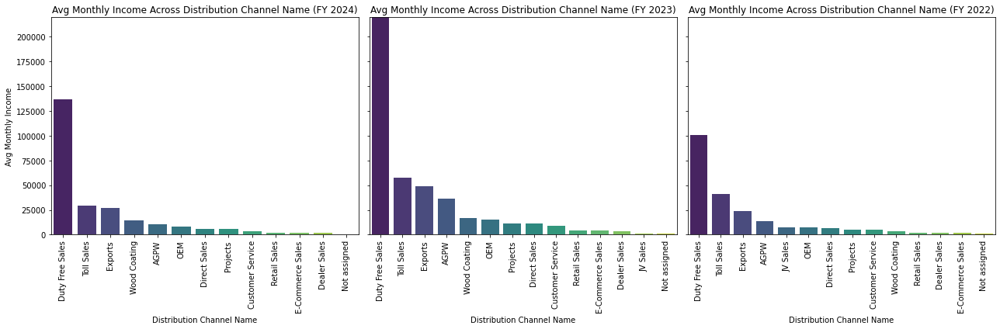

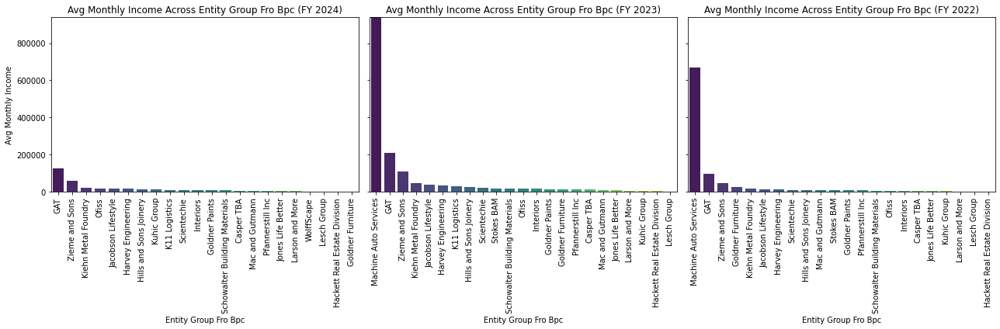

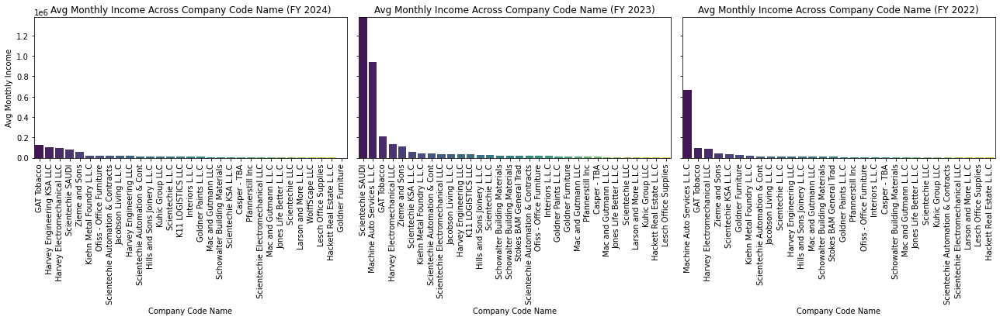

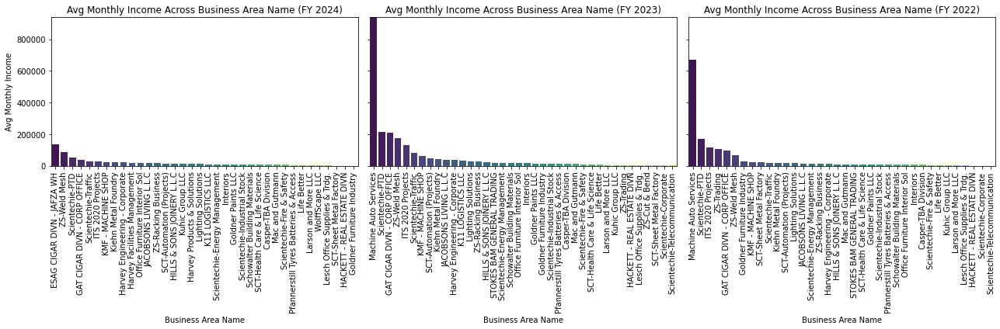

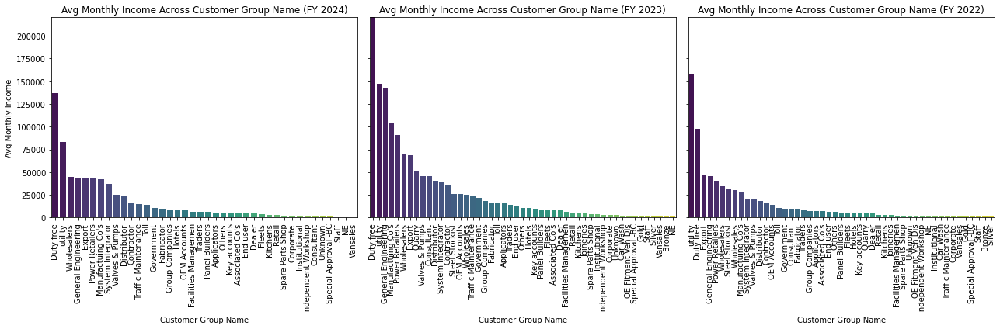

In [13]:
# Function to aggregate income data by each filtered dimensions
def plot_income_across_years(aggregated_data, dimension):
    # Determine the maximum y-axis value across all fiscal years for consistent scaling
    max_income = max(metrics.max() for year_metrics in aggregated_data.values() for metrics in year_metrics[dimension].values)

    # Create a figure with subplots for each fiscal year
    fig, axes = plt.subplots(1, len(aggregated_data), figsize=(18, 6), sharey=True)

    for ax, (year, metrics) in zip(axes, aggregated_data.items()):
        sns.barplot(x=metrics[dimension].index, y=metrics[dimension].values, ax=ax, palette="viridis")
        ax.set_title(f'Avg Monthly Income Across {dimension.replace("_", " ").title()} (FY {year})')
        ax.set_xlabel(dimension.replace("_", " ").title())
        ax.set_ylabel('Avg Monthly Income')
        ax.set_ylim(0, max_income)  # Set consistent y-axis scale
        ax.tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.show()

# Visualize average monthly income for each dimension across fiscal years
for dim in dimensions:
    plot_income_across_years(aggregated_income_data, dim)


In [14]:
# Function to aggregate income data by fiscal period and dimension
def aggregate_income_by_dimension(data, dimension):
    aggregated_data = data.groupby(['fiscal_period', dimension])['actual_income_data'].sum().reset_index()
    aggregated_data = aggregated_data[aggregated_data['actual_income_data'] > 0]  # Filter out negative values
    return aggregated_data

# Aggregate data for each dimension
aggregated_data = {dim: aggregate_income_by_dimension(sales_data, dim) for dim in dimensions}


## Plotting area charts for selected dimension, showing sales over time

<Figure size 1008x504 with 0 Axes>

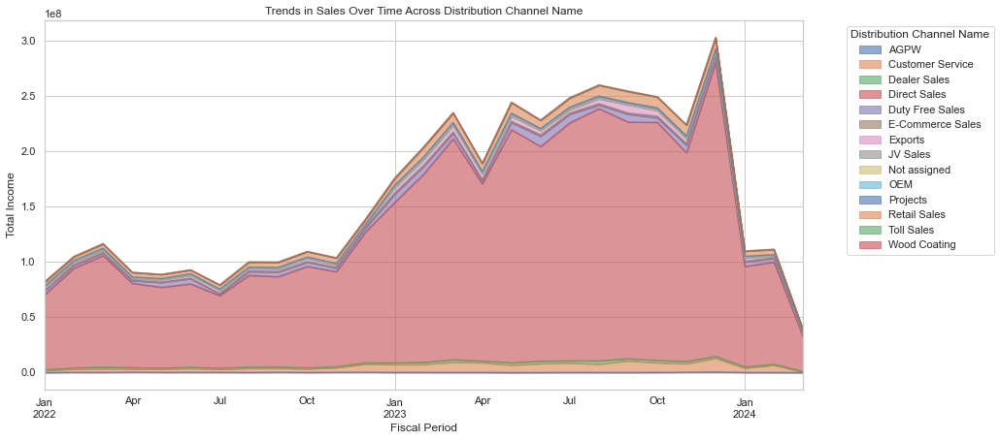

<Figure size 1008x504 with 0 Axes>

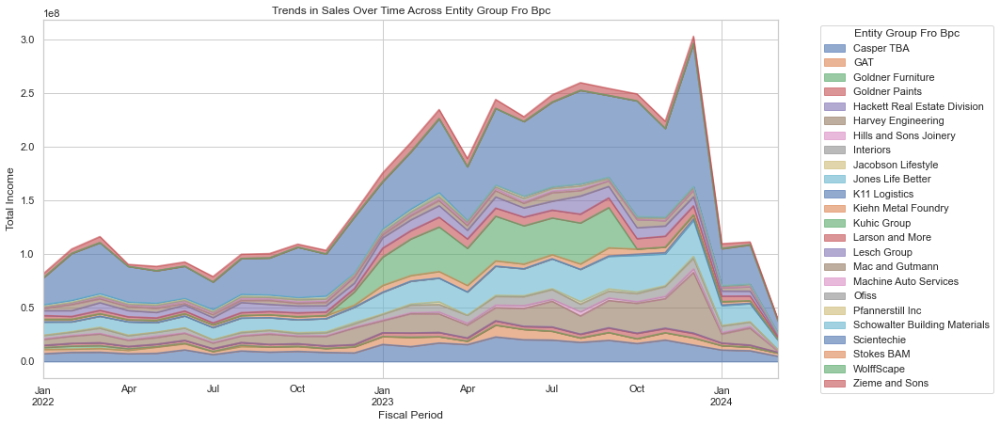

<Figure size 1008x504 with 0 Axes>

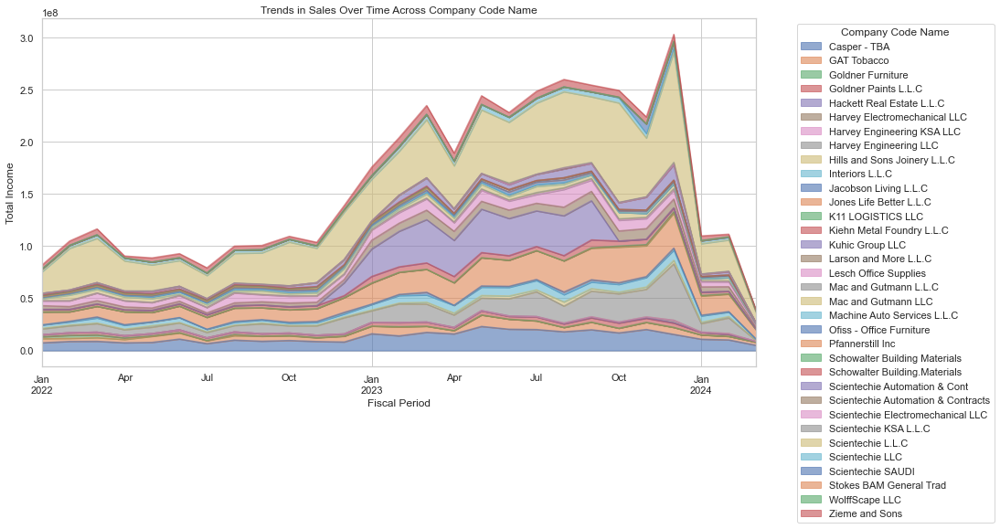

<Figure size 1008x504 with 0 Axes>

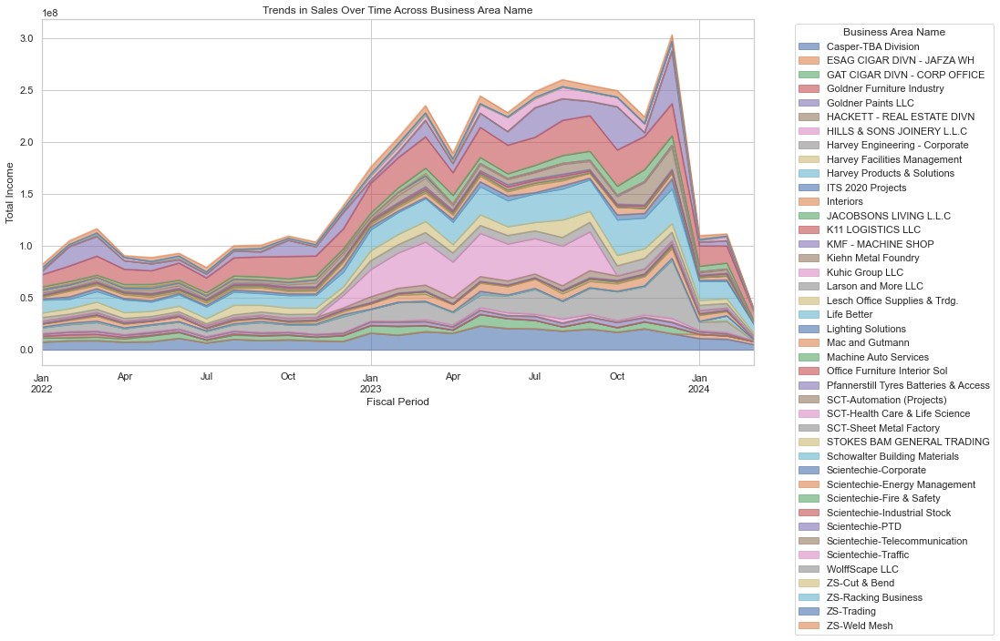

<Figure size 1008x504 with 0 Axes>

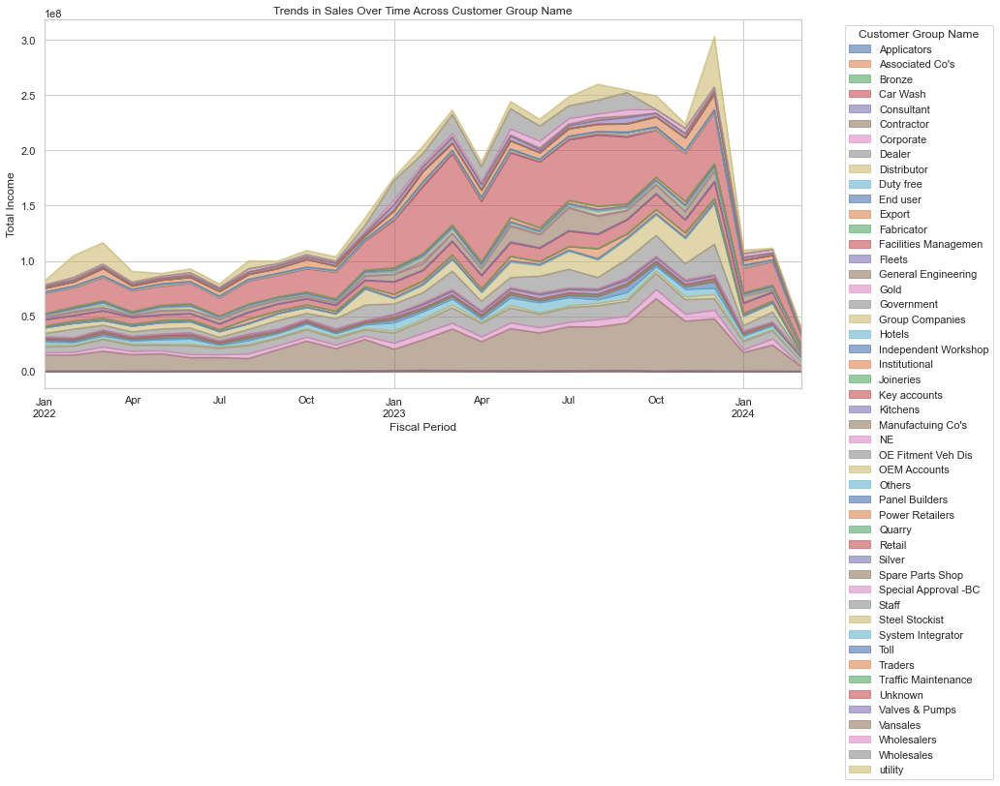

In [15]:
# Function to plot area charts for a given dimension
def plot_area_chart(data, dimension):
    plt.figure(figsize=(14, 7))
    sns.set(style="whitegrid")
    data_pivot = data.pivot(index='fiscal_period', columns=dimension, values='actual_income_data').fillna(0)
    data_pivot.plot(kind='area', stacked=True, figsize=(14, 7), alpha=0.6)
    plt.title(f'Trends in Sales Over Time Across {dimension.replace("_", " ").title()}')
    plt.xlabel('Fiscal Period')
    plt.ylabel('Total Income')
    plt.legend(title=dimension.replace("_", " ").title(), bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

# Plot area charts for each dimension
for dim, data in aggregated_data.items():
    plot_area_chart(data, dim)


# Forecasting of Sales (Prophet)

## Convert DataType and Fill Missing Values

In [16]:
# Ensure fiscal_period is in datetime format with the correct format
sales_data['fiscal_period'] = pd.to_datetime(sales_data['fiscal_period'])#, format='%d/%m/%Y', errors='coerce')

# Fill missing values with appropriate fill methods or constants
sales_data.fillna({'customer_group': 'Unknown', 'customer_group_name': 'Unknown'}, inplace=True)

# Convert columns to appropriate data types
sales_data['fiscal_year'] = sales_data['fiscal_year'].astype(int)
sales_data['posting_period'] = sales_data['posting_period'].astype(int)
sales_data['actual_income_data'] = sales_data['actual_income_data'].astype(float)

# Exclude data for March 2024
sales_data = sales_data[sales_data['fiscal_period'] != '2024-03-01']

## Declaring relevant dimensions and aggregating sales data for them

In [17]:
# Define the relevant dimensions
dimensions = ['distribution_channel_name', 'entity_group_fro_bpc', 'company_code_name', 'business_area_name', 'customer_group_name']

# Function to aggregate income data by fiscal period and dimension
def aggregate_income_by_dimension(data, dimension):
    return data.groupby(['fiscal_period', dimension])['actual_income_data'].sum().reset_index()

# Aggregate data for each dimension
aggregated_data = {dim: aggregate_income_by_dimension(sales_data, dim) for dim in dimensions}

## Identifying high variance categories within each dimension using IQR

In [18]:
# Function to calculate variance and identify high variance categories using IQR
def calculate_variance_and_filter_high_variance(data, dimension):
    # Calculate variance for each category within the dimension
    variance_data = data.groupby(dimension)['actual_income_data'].var().reset_index()
    variance_data.columns = [dimension, 'variance']
    
    # Calculate IQR
    Q1 = variance_data['variance'].quantile(0.25)
    Q3 = variance_data['variance'].quantile(0.75)
    IQR = Q3 - Q1
    
    # Identify high variance categories as those above the upper bound (Q3 + 1.5 * IQR)
    upper_bound = Q3 + 1.5 * IQR
    high_variance_categories = variance_data[variance_data['variance'] > upper_bound][dimension].tolist()
    
    # Filter out high variance categories
    filtered_data = data[~data[dimension].isin(high_variance_categories)]
    
    return filtered_data, high_variance_categories

# Filter high variance categories for each dimension
filtered_data_by_dimension = {}
high_variance_categories_by_dimension = {}

for dim, data in aggregated_data.items():
    filtered_data, high_variance_categories = calculate_variance_and_filter_high_variance(data, dim)
    filtered_data_by_dimension[dim] = filtered_data
    high_variance_categories_by_dimension[dim] = high_variance_categories

# Print high variance categories for each dimension
for dim, high_variance_categories in high_variance_categories_by_dimension.items():
    print(f'High variance categories for {dim}: {high_variance_categories}')

High variance categories for distribution_channel_name: ['Direct Sales']
High variance categories for entity_group_fro_bpc: ['Casper TBA', 'Harvey Engineering', 'Jones Life Better', 'Kuhic Group', 'Scientechie']
High variance categories for company_code_name: ['Casper - TBA', 'Harvey Engineering LLC', 'Jones Life Better L.L.C', 'Kuhic Group LLC', 'Scientechie L.L.C']
High variance categories for business_area_name: ['Casper-TBA Division', 'Harvey Engineering - Corporate', 'Kuhic Group LLC', 'Life Better', 'SCT-Automation (Projects)', 'Scientechie-Industrial Stock', 'Scientechie-PTD']
High variance categories for customer_group_name: ['Contractor', 'Dealer', 'Government', 'Group Companies', 'Key accounts', "Manufactuing Co's", 'Retail', 'Traders', 'Wholesales', 'utility']


## Training and Testing Prophet Forecast model for each category within each selected dimension

In [19]:
# Function to train and evaluate Prophet models for each category within a dimension
def train_and_evaluate_prophet_models(data, dimension):
    categories = data[dimension].unique()
    accuracy_results = {}
    forecast_results = {}
    
    for category in categories:
        category_data = data[data[dimension] == category][['fiscal_period', 'actual_income_data']].rename(columns={'fiscal_period': 'ds', 'actual_income_data': 'y'})
        
        if len(category_data) > 12:  # Ensure there is enough data for training
            # Initialize and train the Prophet model
            model = Prophet()
            model.fit(category_data)
            
            try:
                # Cross-validation
                df_cv = cross_validation(model, initial='365.25 days', period='90 days', horizon='180 days')
                
                # Performance metrics
                df_p = performance_metrics(df_cv)
                
                # Calculate accuracy metrics
                mae = df_p['mae'].mean()
                rmse = df_p['rmse'].mean()
                
                accuracy_results[category] = {'mae': mae, 'rmse': rmse}
                
                # Store the forecast results for visualization
                future = model.make_future_dataframe(periods=12, freq='M')
                forecast = model.predict(future)
                forecast_results[category] = forecast
            
            except ValueError as e:
                print(f"Skipping category {category} due to insufficient data for cross-validation: {e}")
    
    return accuracy_results, forecast_results

# Train and evaluate Prophet models for each dimension
results_by_dimension = {dim: train_and_evaluate_prophet_models(data, dim) for dim, data in filtered_data_by_dimension.items()}

accuracy_results_by_dimension = {dim: results[0] for dim, results in results_by_dimension.items()}
forecast_results_by_dimension = {dim: results[1] for dim, results in results_by_dimension.items()}

15:55:30 - cmdstanpy - INFO - Chain [1] start processing
15:55:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:55:30 - cmdstanpy - INFO - Chain [1] start processing
15:55:31 - cmdstanpy - INFO - Chain [1] done processing
15:55:31 - cmdstanpy - INFO - Chain [1] start processing
15:55:33 - cmdstanpy - INFO - Chain [1] done processing
15:55:33 - cmdstanpy - INFO - Chain [1] start processing
15:55:37 - cmdstanpy - INFO - Chain [1] done processing
15:55:37 - cmdstanpy - INFO - Chain [1] start processing
15:55:37 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:55:37 - cmdstanpy - INFO - Chain [1] start processing
15:55:38 - cmdstanpy - INFO - Chain [1] done processing
15:55:38 - cmdstanpy - INFO - Chain [1] start processing
15:55:41 - cmdstanpy - INFO - Chain [1] done processing
15:55:41 - cmdstanpy - INFO - Chain [1] start processing
15:55:52 - cmdstanpy - INFO - Chain [1] done processing
15:55:52 - cmdstanpy - INFO - Chain [1] start processing
15:55:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:55:52 - cmdstanpy - INFO - Chain [1] start processing
15:55:54 - cmdstanpy - INFO - Chain [1] done processing
15:55:54 - cmdstanpy - INFO - Chain [1] start processing
15:56:02 - cmdstanpy - INFO - Chain [1] done processing
15:56:03 - cmdstanpy - INFO - Chain [1] start processing
15:56:13 - cmdstanpy - INFO - Chain [1] done processing
15:56:13 - cmdstanpy - INFO - Chain [1] start processing
15:56:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:56:13 - cmdstanpy - INFO - Chain [1] start processing
15:56:14 - cmdstanpy - INFO - Chain [1] done processing
15:56:14 - cmdstanpy - INFO - Chain [1] start processing
15:56:22 - cmdstanpy - INFO - Chain [1] done processing
15:56:22 - cmdstanpy - INFO - Chain [1] start processing
15:56:32 - cmdstanpy - INFO - Chain [1] done processing
15:56:32 - cmdstanpy - INFO - Chain [1] start processing
15:56:33 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:56:33 - cmdstanpy - INFO - Chain [1] start processing
15:56:40 - cmdstanpy - INFO - Chain [1] done processing
15:56:40 - cmdstanpy - INFO - Chain [1] start processing
15:56:42 - cmdstanpy - INFO - Chain [1] done processing
15:56:42 - cmdstanpy - INFO - Chain [1] start processing
15:56:52 - cmdstanpy - INFO - Chain [1] done processing
15:56:52 - cmdstanpy - INFO - Chain [1] start processing
15:56:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:56:52 - cmdstanpy - INFO - Chain [1] start processing
15:57:00 - cmdstanpy - INFO - Chain [1] done processing
15:57:00 - cmdstanpy - INFO - Chain [1] start processing
15:57:01 - cmdstanpy - INFO - Chain [1] done processing
15:57:01 - cmdstanpy - INFO - Chain [1] start processing
15:57:09 - cmdstanpy - INFO - Chain [1] done processing
15:57:09 - cmdstanpy - INFO - Chain [1] start processing
15:57:09 - cmdstanpy - INFO - Chain [1] done processing
15:57:09 - cmdstanpy - INFO - Chain [1] start processing


Skipping category JV Sales due to insufficient data for cross-validation: Less data than horizon after initial window. Make horizon or initial shorter.


15:57:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:57:09 - cmdstanpy - INFO - Chain [1] start processing
15:57:17 - cmdstanpy - INFO - Chain [1] done processing
15:57:17 - cmdstanpy - INFO - Chain [1] start processing
15:57:25 - cmdstanpy - INFO - Chain [1] done processing
15:57:25 - cmdstanpy - INFO - Chain [1] start processing
15:57:30 - cmdstanpy - INFO - Chain [1] done processing
15:57:30 - cmdstanpy - INFO - Chain [1] start processing
15:57:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:57:30 - cmdstanpy - INFO - Chain [1] start processing
15:57:32 - cmdstanpy - INFO - Chain [1] done processing
15:57:32 - cmdstanpy - INFO - Chain [1] start processing
15:57:40 - cmdstanpy - INFO - Chain [1] done processing
15:57:40 - cmdstanpy - INFO - Chain [1] start processing
15:57:50 - cmdstanpy - INFO - Chain [1] done processing
15:57:50 - cmdstanpy - INFO - Chain [1] start processing
15:57:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:57:50 - cmdstanpy - INFO - Chain [1] start processing
15:57:52 - cmdstanpy - INFO - Chain [1] done processing
15:57:52 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing
15:57:53 - cmdstanpy - INFO - Chain [1] start processing
15:58:04 - cmdstanpy - INFO - Chain [1] done processing
15:58:04 - cmdstanpy - INFO - Chain [1] start processing
15:58:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:58:04 - cmdstanpy - INFO - Chain [1] start processing
15:58:08 - cmdstanpy - INFO - Chain [1] done processing
15:58:08 - cmdstanpy - INFO - Chain [1] start processing
15:58:16 - cmdstanpy - INFO - Chain [1] done processing
15:58:16 - cmdstanpy - INFO - Chain [1] start processing
15:58:26 - cmdstanpy - INFO - Chain [1] done processing
15:58:27 - cmdstanpy - INFO - Chain [1] start processing
15:58:27 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:58:27 - cmdstanpy - INFO - Chain [1] start processing
15:58:27 - cmdstanpy - INFO - Chain [1] done processing
15:58:27 - cmdstanpy - INFO - Chain [1] start processing
15:58:35 - cmdstanpy - INFO - Chain [1] done processing
15:58:35 - cmdstanpy - INFO - Chain [1] start processing
15:58:38 - cmdstanpy - INFO - Chain [1] done processing
15:58:38 - cmdstanpy - INFO - Chain [1] start processing
15:58:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:58:38 - cmdstanpy - INFO - Chain [1] start processing
15:58:39 - cmdstanpy - INFO - Chain [1] done processing
15:58:39 - cmdstanpy - INFO - Chain [1] start processing
15:58:40 - cmdstanpy - INFO - Chain [1] done processing
15:58:40 - cmdstanpy - INFO - Chain [1] start processing
15:58:50 - cmdstanpy - INFO - Chain [1] done processing
15:58:50 - cmdstanpy - INFO - Chain [1] start processing
15:58:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:58:50 - cmdstanpy - INFO - Chain [1] start processing
15:58:50 - cmdstanpy - INFO - Chain [1] done processing
15:58:51 - cmdstanpy - INFO - Chain [1] start processing
15:58:59 - cmdstanpy - INFO - Chain [1] done processing
15:58:59 - cmdstanpy - INFO - Chain [1] start processing
15:59:08 - cmdstanpy - INFO - Chain [1] done processing
15:59:09 - cmdstanpy - INFO - Chain [1] start processing
15:59:09 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:59:09 - cmdstanpy - INFO - Chain [1] start processing
15:59:09 - cmdstanpy - INFO - Chain [1] done processing
15:59:10 - cmdstanpy - INFO - Chain [1] start processing
15:59:18 - cmdstanpy - INFO - Chain [1] done processing
15:59:18 - cmdstanpy - INFO - Chain [1] start processing
15:59:20 - cmdstanpy - INFO - Chain [1] done processing
15:59:20 - cmdstanpy - INFO - Chain [1] start processing
15:59:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:59:20 - cmdstanpy - INFO - Chain [1] start processing
15:59:27 - cmdstanpy - INFO - Chain [1] done processing
15:59:27 - cmdstanpy - INFO - Chain [1] start processing
15:59:36 - cmdstanpy - INFO - Chain [1] done processing
15:59:36 - cmdstanpy - INFO - Chain [1] start processing
15:59:46 - cmdstanpy - INFO - Chain [1] done processing
15:59:46 - cmdstanpy - INFO - Chain [1] start processing
15:59:46 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

15:59:46 - cmdstanpy - INFO - Chain [1] start processing
15:59:53 - cmdstanpy - INFO - Chain [1] done processing
15:59:54 - cmdstanpy - INFO - Chain [1] start processing
15:59:56 - cmdstanpy - INFO - Chain [1] done processing
15:59:56 - cmdstanpy - INFO - Chain [1] start processing
16:00:00 - cmdstanpy - INFO - Chain [1] done processing
16:00:01 - cmdstanpy - INFO - Chain [1] start processing
16:00:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:00:01 - cmdstanpy - INFO - Chain [1] start processing
16:00:02 - cmdstanpy - INFO - Chain [1] done processing
16:00:02 - cmdstanpy - INFO - Chain [1] start processing
16:00:10 - cmdstanpy - INFO - Chain [1] done processing
16:00:10 - cmdstanpy - INFO - Chain [1] start processing
16:00:20 - cmdstanpy - INFO - Chain [1] done processing
16:00:20 - cmdstanpy - INFO - Chain [1] start processing
16:00:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:00:20 - cmdstanpy - INFO - Chain [1] start processing
16:00:21 - cmdstanpy - INFO - Chain [1] done processing
16:00:21 - cmdstanpy - INFO - Chain [1] start processing
16:00:22 - cmdstanpy - INFO - Chain [1] done processing
16:00:22 - cmdstanpy - INFO - Chain [1] start processing
16:00:24 - cmdstanpy - INFO - Chain [1] done processing
16:00:24 - cmdstanpy - INFO - Chain [1] start processing
16:00:24 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:00:24 - cmdstanpy - INFO - Chain [1] start processing
16:00:31 - cmdstanpy - INFO - Chain [1] done processing
16:00:32 - cmdstanpy - INFO - Chain [1] start processing
16:00:40 - cmdstanpy - INFO - Chain [1] done processing
16:00:40 - cmdstanpy - INFO - Chain [1] start processing
16:00:50 - cmdstanpy - INFO - Chain [1] done processing
16:00:50 - cmdstanpy - INFO - Chain [1] start processing
16:00:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:00:50 - cmdstanpy - INFO - Chain [1] start processing
16:00:55 - cmdstanpy - INFO - Chain [1] done processing
16:00:55 - cmdstanpy - INFO - Chain [1] start processing
16:01:03 - cmdstanpy - INFO - Chain [1] done processing
16:01:03 - cmdstanpy - INFO - Chain [1] start processing
16:01:13 - cmdstanpy - INFO - Chain [1] done processing
16:01:13 - cmdstanpy - INFO - Chain [1] start processing
16:01:13 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:01:13 - cmdstanpy - INFO - Chain [1] start processing
16:01:20 - cmdstanpy - INFO - Chain [1] done processing
16:01:20 - cmdstanpy - INFO - Chain [1] start processing
16:01:21 - cmdstanpy - INFO - Chain [1] done processing
16:01:21 - cmdstanpy - INFO - Chain [1] start processing
16:01:28 - cmdstanpy - INFO - Chain [1] done processing
16:01:28 - cmdstanpy - INFO - Chain [1] start processing
16:01:28 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:01:28 - cmdstanpy - INFO - Chain [1] start processing
16:01:31 - cmdstanpy - INFO - Chain [1] done processing
16:01:32 - cmdstanpy - INFO - Chain [1] start processing
16:01:32 - cmdstanpy - INFO - Chain [1] done processing
16:01:32 - cmdstanpy - INFO - Chain [1] start processing
16:01:38 - cmdstanpy - INFO - Chain [1] done processing
16:01:38 - cmdstanpy - INFO - Chain [1] start processing
16:01:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

16:01:38 - cmdstanpy - INFO - Chain [1] start processing
16:01:38 - cmdstanpy - INFO - Chain [1] done processing
16:01:39 - cmdstanpy - INFO - Chain [1] start processing
16:01:39 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:01:39 - cmdstanpy - INFO - Chain [1] start processing
16:01:43 - cmdstanpy - INFO - Chain [1] done processing
16:01:43 - cmdstanpy - INFO - Chain [1] start processing
16:01:44 - cmdstanpy - INFO - Chain [1] done processing
16:01:44 - cmdstanpy - INFO - Chain [1] start processing
16:01:55 - cmdstanpy - INFO - Chain [1] done processing
16:01:55 - cmdstanpy - INFO - Chain [1] start processing
16:01:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:01:55 - cmdstanpy - INFO - Chain [1] start processing
16:01:56 - cmdstanpy - INFO - Chain [1] done processing
16:01:56 - cmdstanpy - INFO - Chain [1] start processing
16:02:04 - cmdstanpy - INFO - Chain [1] done processing
16:02:04 - cmdstanpy - INFO - Chain [1] start processing
16:02:14 - cmdstanpy - INFO - Chain [1] done processing
16:02:14 - cmdstanpy - INFO - Chain [1] start processing
16:02:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:02:14 - cmdstanpy - INFO - Chain [1] start processing
16:02:15 - cmdstanpy - INFO - Chain [1] done processing
16:02:16 - cmdstanpy - INFO - Chain [1] start processing
16:02:16 - cmdstanpy - INFO - Chain [1] done processing
16:02:16 - cmdstanpy - INFO - Chain [1] start processing
16:02:18 - cmdstanpy - INFO - Chain [1] done processing
16:02:18 - cmdstanpy - INFO - Chain [1] start processing
16:02:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:02:18 - cmdstanpy - INFO - Chain [1] start processing
16:02:18 - cmdstanpy - INFO - Chain [1] done processing
16:02:19 - cmdstanpy - INFO - Chain [1] start processing
16:02:20 - cmdstanpy - INFO - Chain [1] done processing
16:02:20 - cmdstanpy - INFO - Chain [1] start processing
16:02:30 - cmdstanpy - INFO - Chain [1] done processing
16:02:30 - cmdstanpy - INFO - Chain [1] start processing
16:02:30 - cmdstanpy - INFO - Chain [1] done processing
16:02:31 - cmdstanpy - INFO - Chain [1] start processing


Skipping category Hackett Real Estate Division due to insufficient data for cross-validation: Less data than horizon after initial window. Make horizon or initial shorter.


16:02:31 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:02:31 - cmdstanpy - INFO - Chain [1] start processing
16:02:31 - cmdstanpy - INFO - Chain [1] done processing
16:02:31 - cmdstanpy - INFO - Chain [1] start processing
16:02:39 - cmdstanpy - INFO - Chain [1] done processing
16:02:39 - cmdstanpy - INFO - Chain [1] start processing
16:02:49 - cmdstanpy - INFO - Chain [1] done processing
16:02:49 - cmdstanpy - INFO - Chain [1] start processing
16:02:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:02:50 - cmdstanpy - INFO - Chain [1] start processing
16:02:50 - cmdstanpy - INFO - Chain [1] done processing
16:02:50 - cmdstanpy - INFO - Chain [1] start processing
16:02:58 - cmdstanpy - INFO - Chain [1] done processing
16:02:59 - cmdstanpy - INFO - Chain [1] start processing
16:03:00 - cmdstanpy - INFO - Chain [1] done processing
16:03:01 - cmdstanpy - INFO - Chain [1] start processing
16:03:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:03:01 - cmdstanpy - INFO - Chain [1] start processing
16:03:08 - cmdstanpy - INFO - Chain [1] done processing
16:03:08 - cmdstanpy - INFO - Chain [1] start processing
16:03:16 - cmdstanpy - INFO - Chain [1] done processing
16:03:16 - cmdstanpy - INFO - Chain [1] start processing
16:03:26 - cmdstanpy - INFO - Chain [1] done processing
16:03:26 - cmdstanpy - INFO - Chain [1] start processing
16:03:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:03:26 - cmdstanpy - INFO - Chain [1] start processing
16:03:34 - cmdstanpy - INFO - Chain [1] done processing
16:03:34 - cmdstanpy - INFO - Chain [1] start processing
16:03:36 - cmdstanpy - INFO - Chain [1] done processing
16:03:36 - cmdstanpy - INFO - Chain [1] start processing
16:03:41 - cmdstanpy - INFO - Chain [1] done processing
16:03:41 - cmdstanpy - INFO - Chain [1] start processing
16:03:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:03:41 - cmdstanpy - INFO - Chain [1] start processing
16:03:42 - cmdstanpy - INFO - Chain [1] done processing
16:03:42 - cmdstanpy - INFO - Chain [1] start processing
16:03:50 - cmdstanpy - INFO - Chain [1] done processing
16:03:50 - cmdstanpy - INFO - Chain [1] start processing
16:04:00 - cmdstanpy - INFO - Chain [1] done processing
16:04:01 - cmdstanpy - INFO - Chain [1] start processing
16:04:01 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:04:01 - cmdstanpy - INFO - Chain [1] start processing
16:04:01 - cmdstanpy - INFO - Chain [1] done processing
16:04:02 - cmdstanpy - INFO - Chain [1] start processing
16:04:02 - cmdstanpy - INFO - Chain [1] done processing
16:04:02 - cmdstanpy - INFO - Chain [1] start processing
16:04:04 - cmdstanpy - INFO - Chain [1] done processing
16:04:04 - cmdstanpy - INFO - Chain [1] start processing
16:04:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:04:05 - cmdstanpy - INFO - Chain [1] start processing
16:04:12 - cmdstanpy - INFO - Chain [1] done processing
16:04:12 - cmdstanpy - INFO - Chain [1] start processing
16:04:20 - cmdstanpy - INFO - Chain [1] done processing
16:04:20 - cmdstanpy - INFO - Chain [1] start processing
16:04:31 - cmdstanpy - INFO - Chain [1] done processing
16:04:32 - cmdstanpy - INFO - Chain [1] start processing
16:04:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:04:32 - cmdstanpy - INFO - Chain [1] start processing
16:04:36 - cmdstanpy - INFO - Chain [1] done processing
16:04:36 - cmdstanpy - INFO - Chain [1] start processing
16:04:44 - cmdstanpy - INFO - Chain [1] done processing
16:04:44 - cmdstanpy - INFO - Chain [1] start processing
16:04:54 - cmdstanpy - INFO - Chain [1] done processing
16:04:54 - cmdstanpy - INFO - Chain [1] start processing
16:04:54 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:04:54 - cmdstanpy - INFO - Chain [1] start processing
16:05:02 - cmdstanpy - INFO - Chain [1] done processing
16:05:02 - cmdstanpy - INFO - Chain [1] start processing
16:05:02 - cmdstanpy - INFO - Chain [1] done processing
16:05:03 - cmdstanpy - INFO - Chain [1] start processing
16:05:09 - cmdstanpy - INFO - Chain [1] done processing
16:05:09 - cmdstanpy - INFO - Chain [1] start processing
16:05:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:05:10 - cmdstanpy - INFO - Chain [1] start processing
16:05:11 - cmdstanpy - INFO - Chain [1] done processing
16:05:11 - cmdstanpy - INFO - Chain [1] start processing
16:05:12 - cmdstanpy - INFO - Chain [1] done processing
16:05:12 - cmdstanpy - INFO - Chain [1] start processing
16:05:21 - cmdstanpy - INFO - Chain [1] done processing
16:05:22 - cmdstanpy - INFO - Chain [1] start processing
16:05:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:05:22 - cmdstanpy - INFO - Chain [1] start processing
16:05:29 - cmdstanpy - INFO - Chain [1] done processing
16:05:29 - cmdstanpy - INFO - Chain [1] start processing
16:05:37 - cmdstanpy - INFO - Chain [1] done processing
16:05:37 - cmdstanpy - INFO - Chain [1] start processing
16:05:47 - cmdstanpy - INFO - Chain [1] done processing
16:05:47 - cmdstanpy - INFO - Chain [1] start processing
16:05:47 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

16:05:47 - cmdstanpy - INFO - Chain [1] start processing
16:05:47 - cmdstanpy - INFO - Chain [1] done processing
16:05:48 - cmdstanpy - INFO - Chain [1] start processing
16:05:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:05:48 - cmdstanpy - INFO - Chain [1] start processing
16:05:51 - cmdstanpy - INFO - Chain [1] done processing
16:05:52 - cmdstanpy - INFO - Chain [1] start processing
16:05:53 - cmdstanpy - INFO - Chain [1] done processing
16:05:53 - cmdstanpy - INFO - Chain [1] start processing
16:06:04 - cmdstanpy - INFO - Chain [1] done processing
16:06:04 - cmdstanpy - INFO - Chain [1] start processing
16:06:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:06:04 - cmdstanpy - INFO - Chain [1] start processing
16:06:05 - cmdstanpy - INFO - Chain [1] done processing
16:06:05 - cmdstanpy - INFO - Chain [1] start processing
16:06:13 - cmdstanpy - INFO - Chain [1] done processing
16:06:13 - cmdstanpy - INFO - Chain [1] start processing
16:06:23 - cmdstanpy - INFO - Chain [1] done processing
16:06:23 - cmdstanpy - INFO - Chain [1] start processing
16:06:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:06:23 - cmdstanpy - INFO - Chain [1] start processing
16:06:23 - cmdstanpy - INFO - Chain [1] done processing
16:06:23 - cmdstanpy - INFO - Chain [1] start processing
16:06:24 - cmdstanpy - INFO - Chain [1] done processing
16:06:24 - cmdstanpy - INFO - Chain [1] start processing
16:06:29 - cmdstanpy - INFO - Chain [1] done processing
16:06:30 - cmdstanpy - INFO - Chain [1] start processing
16:06:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

16:06:30 - cmdstanpy - INFO - Chain [1] start processing
16:06:30 - cmdstanpy - INFO - Chain [1] done processing
16:06:30 - cmdstanpy - INFO - Chain [1] start processing
16:06:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:06:30 - cmdstanpy - INFO - Chain [1] start processing
16:06:31 - cmdstanpy - INFO - Chain [1] done processing
16:06:31 - cmdstanpy - INFO - Chain [1] start processing
16:06:39 - cmdstanpy - INFO - Chain [1] done processing
16:06:39 - cmdstanpy - INFO - Chain [1] start processing
16:06:49 - cmdstanpy - INFO - Chain [1] done processing
16:06:49 - cmdstanpy - INFO - Chain [1] start processing
16:06:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:06:49 - cmdstanpy - INFO - Chain [1] start processing
16:06:59 - cmdstanpy - INFO - Chain [1] done processing
16:06:59 - cmdstanpy - INFO - Chain [1] start processing
16:07:04 - cmdstanpy - INFO - Chain [1] done processing
16:07:04 - cmdstanpy - INFO - Chain [1] start processing
16:07:06 - cmdstanpy - INFO - Chain [1] done processing
16:07:07 - cmdstanpy - INFO - Chain [1] start processing
16:07:17 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:07:17 - cmdstanpy - INFO - Chain [1] start processing
16:07:17 - cmdstanpy - INFO - Chain [1] done processing
16:07:17 - cmdstanpy - INFO - Chain [1] start processing
16:07:20 - cmdstanpy - INFO - Chain [1] done processing
16:07:20 - cmdstanpy - INFO - Chain [1] start processing
16:07:20 - cmdstanpy - INFO - Chain [1] done processing
16:07:21 - cmdstanpy - INFO - Chain [1] start processing
16:07:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:07:21 - cmdstanpy - INFO - Chain [1] start processing
16:07:21 - cmdstanpy - INFO - Chain [1] done processing
16:07:21 - cmdstanpy - INFO - Chain [1] start processing
16:07:30 - cmdstanpy - INFO - Chain [1] done processing
16:07:30 - cmdstanpy - INFO - Chain [1] start processing
16:07:32 - cmdstanpy - INFO - Chain [1] done processing
16:07:32 - cmdstanpy - INFO - Chain [1] start processing
16:07:32 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:07:32 - cmdstanpy - INFO - Chain [1] start processing
16:07:33 - cmdstanpy - INFO - Chain [1] done processing
16:07:33 - cmdstanpy - INFO - Chain [1] start processing
16:07:34 - cmdstanpy - INFO - Chain [1] done processing
16:07:34 - cmdstanpy - INFO - Chain [1] start processing
16:07:44 - cmdstanpy - INFO - Chain [1] done processing
16:07:44 - cmdstanpy - INFO - Chain [1] start processing
16:07:44 - cmdstanpy - INFO - Chain [1] done processing
16:07:44 - cmdstanpy - INFO - Chain [1] start processing
16:07:44 - cmdstanpy - INFO - Chain [1] done processing


Skipping category Hackett Real Estate L.L.C due to insufficient data for cross-validation: Less data than horizon after initial window. Make horizon or initial shorter.
Skipping category Harvey Electromechanical LLC due to insufficient data for cross-validation: Less data than horizon after initial window. Make horizon or initial shorter.


16:07:45 - cmdstanpy - INFO - Chain [1] start processing
16:07:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:07:45 - cmdstanpy - INFO - Chain [1] start processing
16:07:45 - cmdstanpy - INFO - Chain [1] done processing
16:07:45 - cmdstanpy - INFO - Chain [1] start processing
16:07:53 - cmdstanpy - INFO - Chain [1] done processing
16:07:53 - cmdstanpy - INFO - Chain [1] start processing
16:08:03 - cmdstanpy - INFO - Chain [1] done processing
16:08:03 - cmdstanpy - INFO - Chain [1] start processing
16:08:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:08:03 - cmdstanpy - INFO - Chain [1] start processing
16:08:04 - cmdstanpy - INFO - Chain [1] done processing
16:08:04 - cmdstanpy - INFO - Chain [1] start processing
16:08:12 - cmdstanpy - INFO - Chain [1] done processing
16:08:12 - cmdstanpy - INFO - Chain [1] start processing
16:08:14 - cmdstanpy - INFO - Chain [1] done processing
16:08:14 - cmdstanpy - INFO - Chain [1] start processing
16:08:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:08:14 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing
16:08:22 - cmdstanpy - INFO - Chain [1] start processing
16:08:30 - cmdstanpy - INFO - Chain [1] done processing
16:08:30 - cmdstanpy - INFO - Chain [1] start processing
16:08:40 - cmdstanpy - INFO - Chain [1] done processing
16:08:40 - cmdstanpy - INFO - Chain [1] start processing
16:08:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:08:40 - cmdstanpy - INFO - Chain [1] start processing
16:08:47 - cmdstanpy - INFO - Chain [1] done processing
16:08:47 - cmdstanpy - INFO - Chain [1] start processing
16:08:49 - cmdstanpy - INFO - Chain [1] done processing
16:08:50 - cmdstanpy - INFO - Chain [1] start processing
16:08:54 - cmdstanpy - INFO - Chain [1] done processing
16:08:55 - cmdstanpy - INFO - Chain [1] start processing
16:08:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:08:55 - cmdstanpy - INFO - Chain [1] start processing
16:09:02 - cmdstanpy - INFO - Chain [1] done processing
16:09:02 - cmdstanpy - INFO - Chain [1] start processing
16:09:10 - cmdstanpy - INFO - Chain [1] done processing
16:09:10 - cmdstanpy - INFO - Chain [1] start processing
16:09:20 - cmdstanpy - INFO - Chain [1] done processing
16:09:20 - cmdstanpy - INFO - Chain [1] start processing
16:09:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:09:20 - cmdstanpy - INFO - Chain [1] start processing
16:09:21 - cmdstanpy - INFO - Chain [1] done processing
16:09:21 - cmdstanpy - INFO - Chain [1] start processing
16:09:29 - cmdstanpy - INFO - Chain [1] done processing
16:09:30 - cmdstanpy - INFO - Chain [1] start processing
16:09:40 - cmdstanpy - INFO - Chain [1] done processing
16:09:40 - cmdstanpy - INFO - Chain [1] start processing
16:09:40 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:09:40 - cmdstanpy - INFO - Chain [1] start processing
16:09:41 - cmdstanpy - INFO - Chain [1] done processing
16:09:41 - cmdstanpy - INFO - Chain [1] start processing
16:09:41 - cmdstanpy - INFO - Chain [1] done processing
16:09:42 - cmdstanpy - INFO - Chain [1] start processing
16:09:43 - cmdstanpy - INFO - Chain [1] done processing
16:09:43 - cmdstanpy - INFO - Chain [1] start processing
16:09:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:09:44 - cmdstanpy - INFO - Chain [1] start processing
16:09:44 - cmdstanpy - INFO - Chain [1] done processing
16:09:45 - cmdstanpy - INFO - Chain [1] start processing
16:09:53 - cmdstanpy - INFO - Chain [1] done processing
16:09:53 - cmdstanpy - INFO - Chain [1] start processing
16:10:03 - cmdstanpy - INFO - Chain [1] done processing
16:10:03 - cmdstanpy - INFO - Chain [1] start processing
16:10:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:10:03 - cmdstanpy - INFO - Chain [1] start processing
16:10:04 - cmdstanpy - INFO - Chain [1] done processing
16:10:04 - cmdstanpy - INFO - Chain [1] start processing
16:10:12 - cmdstanpy - INFO - Chain [1] done processing
16:10:12 - cmdstanpy - INFO - Chain [1] start processing
16:10:22 - cmdstanpy - INFO - Chain [1] done processing
16:10:22 - cmdstanpy - INFO - Chain [1] start processing
16:10:22 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:10:22 - cmdstanpy - INFO - Chain [1] start processing
16:10:26 - cmdstanpy - INFO - Chain [1] done processing
16:10:27 - cmdstanpy - INFO - Chain [1] start processing
16:10:35 - cmdstanpy - INFO - Chain [1] done processing
16:10:35 - cmdstanpy - INFO - Chain [1] start processing
16:10:44 - cmdstanpy - INFO - Chain [1] done processing
16:10:45 - cmdstanpy - INFO - Chain [1] start processing
16:10:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:10:45 - cmdstanpy - INFO - Chain [1] start processing
16:10:52 - cmdstanpy - INFO - Chain [1] done processing
16:10:52 - cmdstanpy - INFO - Chain [1] start processing
16:10:53 - cmdstanpy - INFO - Chain [1] done processing
16:10:53 - cmdstanpy - INFO - Chain [1] start processing
16:10:59 - cmdstanpy - INFO - Chain [1] done processing
16:11:00 - cmdstanpy - INFO - Chain [1] start processing
16:11:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:11:00 - cmdstanpy - INFO - Chain [1] start processing
16:11:00 - cmdstanpy - INFO - Chain [1] done processing
16:11:00 - cmdstanpy - INFO - Chain [1] start processing
16:11:08 - cmdstanpy - INFO - Chain [1] done processing
16:11:08 - cmdstanpy - INFO - Chain [1] start processing
16:11:09 - cmdstanpy - INFO - Chain [1] done processing
16:11:09 - cmdstanpy - INFO - Chain [1] start processing
16:11:10 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:11:10 - cmdstanpy - INFO - Chain [1] start processing
16:11:13 - cmdstanpy - INFO - Chain [1] done processing
16:11:13 - cmdstanpy - INFO - Chain [1] start processing
16:11:14 - cmdstanpy - INFO - Chain [1] done processing
16:11:14 - cmdstanpy - INFO - Chain [1] start processing
16:11:19 - cmdstanpy - INFO - Chain [1] done processing
16:11:19 - cmdstanpy - INFO - Chain [1] start processing
16:11:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

16:11:20 - cmdstanpy - INFO - Chain [1] start processing
16:11:20 - cmdstanpy - INFO - Chain [1] done processing
16:11:20 - cmdstanpy - INFO - Chain [1] start processing
16:11:20 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:11:20 - cmdstanpy - INFO - Chain [1] start processing
16:11:24 - cmdstanpy - INFO - Chain [1] done processing
16:11:24 - cmdstanpy - INFO - Chain [1] start processing
16:11:25 - cmdstanpy - INFO - Chain [1] done processing
16:11:25 - cmdstanpy - INFO - Chain [1] start processing
16:11:36 - cmdstanpy - INFO - Chain [1] done processing
16:11:36 - cmdstanpy - INFO - Chain [1] start processing
16:11:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:11:36 - cmdstanpy - INFO - Chain [1] start processing
16:11:37 - cmdstanpy - INFO - Chain [1] done processing
16:11:37 - cmdstanpy - INFO - Chain [1] start processing
16:11:45 - cmdstanpy - INFO - Chain [1] done processing
16:11:45 - cmdstanpy - INFO - Chain [1] start processing
16:11:55 - cmdstanpy - INFO - Chain [1] done processing
16:11:55 - cmdstanpy - INFO - Chain [1] start processing
16:11:55 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:11:56 - cmdstanpy - INFO - Chain [1] start processing
16:12:03 - cmdstanpy - INFO - Chain [1] done processing
16:12:03 - cmdstanpy - INFO - Chain [1] start processing
16:12:03 - cmdstanpy - INFO - Chain [1] done processing
16:12:04 - cmdstanpy - INFO - Chain [1] start processing
16:12:14 - cmdstanpy - INFO - Chain [1] done processing
16:12:14 - cmdstanpy - INFO - Chain [1] start processing
16:12:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:12:14 - cmdstanpy - INFO - Chain [1] start processing
16:12:15 - cmdstanpy - INFO - Chain [1] done processing
16:12:15 - cmdstanpy - INFO - Chain [1] start processing
16:12:15 - cmdstanpy - INFO - Chain [1] done processing
16:12:16 - cmdstanpy - INFO - Chain [1] start processing
16:12:17 - cmdstanpy - INFO - Chain [1] done processing
16:12:18 - cmdstanpy - INFO - Chain [1] start processing
16:12:18 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:12:18 - cmdstanpy - INFO - Chain [1] start processing
16:12:18 - cmdstanpy - INFO - Chain [1] done processing
16:12:18 - cmdstanpy - INFO - Chain [1] start processing
16:12:22 - cmdstanpy - INFO - Chain [1] done processing
16:12:23 - cmdstanpy - INFO - Chain [1] start processing
16:12:25 - cmdstanpy - INFO - Chain [1] done processing
16:12:25 - cmdstanpy - INFO - Chain [1] start processing
16:12:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:12:26 - cmdstanpy - INFO - Chain [1] start processing
16:12:27 - cmdstanpy - INFO - Chain [1] done processing
16:12:27 - cmdstanpy - INFO - Chain [1] start processing
16:12:28 - cmdstanpy - INFO - Chain [1] done processing
16:12:28 - cmdstanpy - INFO - Chain [1] start processing
16:12:38 - cmdstanpy - INFO - Chain [1] done processing
16:12:38 - cmdstanpy - INFO - Chain [1] start processing
16:12:38 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:12:38 - cmdstanpy - INFO - Chain [1] start processing
16:12:46 - cmdstanpy - INFO - Chain [1] done processing
16:12:46 - cmdstanpy - INFO - Chain [1] start processing
16:12:47 - cmdstanpy - INFO - Chain [1] done processing
16:12:47 - cmdstanpy - INFO - Chain [1] start processing
16:12:51 - cmdstanpy - INFO - Chain [1] done processing
16:12:51 - cmdstanpy - INFO - Chain [1] start processing
16:12:51 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:12:52 - cmdstanpy - INFO - Chain [1] start processing
16:12:52 - cmdstanpy - INFO - Chain [1] done processing
16:12:52 - cmdstanpy - INFO - Chain [1] start processing
16:12:53 - cmdstanpy - INFO - Chain [1] done processing
16:12:53 - cmdstanpy - INFO - Chain [1] start processing
16:13:03 - cmdstanpy - INFO - Chain [1] done processing
16:13:04 - cmdstanpy - INFO - Chain [1] start processing
16:13:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:13:04 - cmdstanpy - INFO - Chain [1] start processing
16:13:11 - cmdstanpy - INFO - Chain [1] done processing
16:13:11 - cmdstanpy - INFO - Chain [1] start processing
16:13:12 - cmdstanpy - INFO - Chain [1] done processing
16:13:12 - cmdstanpy - INFO - Chain [1] start processing
16:13:22 - cmdstanpy - INFO - Chain [1] done processing
16:13:22 - cmdstanpy - INFO - Chain [1] start processing
16:13:22 - cmdstanpy - INFO - Chain [1] done processing
16:13:23 - cmdstanpy - INFO - Chain [1] start processing


Skipping category HACKETT - REAL ESTATE DIVN due to insufficient data for cross-validation: Less data than horizon after initial window. Make horizon or initial shorter.


16:13:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:13:23 - cmdstanpy - INFO - Chain [1] start processing
16:13:30 - cmdstanpy - INFO - Chain [1] done processing
16:13:30 - cmdstanpy - INFO - Chain [1] start processing
16:13:38 - cmdstanpy - INFO - Chain [1] done processing
16:13:38 - cmdstanpy - INFO - Chain [1] start processing
16:13:40 - cmdstanpy - INFO - Chain [1] done processing
16:13:40 - cmdstanpy - INFO - Chain [1] start processing
16:13:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:13:41 - cmdstanpy - INFO - Chain [1] start processing
16:13:42 - cmdstanpy - INFO - Chain [1] done processing
16:13:42 - cmdstanpy - INFO - Chain [1] start processing
16:13:50 - cmdstanpy - INFO - Chain [1] done processing
16:13:50 - cmdstanpy - INFO - Chain [1] start processing
16:14:00 - cmdstanpy - INFO - Chain [1] done processing
16:14:00 - cmdstanpy - INFO - Chain [1] start processing
16:14:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:14:00 - cmdstanpy - INFO - Chain [1] start processing
16:14:01 - cmdstanpy - INFO - Chain [1] done processing
16:14:01 - cmdstanpy - INFO - Chain [1] start processing
16:14:09 - cmdstanpy - INFO - Chain [1] done processing
16:14:09 - cmdstanpy - INFO - Chain [1] start processing
16:14:13 - cmdstanpy - INFO - Chain [1] done processing
16:14:13 - cmdstanpy - INFO - Chain [1] start processing
16:14:14 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:14:14 - cmdstanpy - INFO - Chain [1] start processing
16:14:21 - cmdstanpy - INFO - Chain [1] done processing
16:14:21 - cmdstanpy - INFO - Chain [1] start processing
16:14:29 - cmdstanpy - INFO - Chain [1] done processing
16:14:29 - cmdstanpy - INFO - Chain [1] start processing
16:14:30 - cmdstanpy - INFO - Chain [1] done processing
16:14:30 - cmdstanpy - INFO - Chain [1] start processing
16:14:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:14:30 - cmdstanpy - INFO - Chain [1] start processing
16:14:37 - cmdstanpy - INFO - Chain [1] done processing
16:14:38 - cmdstanpy - INFO - Chain [1] start processing
16:14:42 - cmdstanpy - INFO - Chain [1] done processing
16:14:42 - cmdstanpy - INFO - Chain [1] start processing
16:14:52 - cmdstanpy - INFO - Chain [1] done processing
16:14:52 - cmdstanpy - INFO - Chain [1] start processing
16:14:52 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:14:52 - cmdstanpy - INFO - Chain [1] start processing
16:14:53 - cmdstanpy - INFO - Chain [1] done processing
16:14:53 - cmdstanpy - INFO - Chain [1] start processing
16:15:01 - cmdstanpy - INFO - Chain [1] done processing
16:15:01 - cmdstanpy - INFO - Chain [1] start processing
16:15:11 - cmdstanpy - INFO - Chain [1] done processing
16:15:11 - cmdstanpy - INFO - Chain [1] start processing
16:15:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:15:11 - cmdstanpy - INFO - Chain [1] start processing
16:15:18 - cmdstanpy - INFO - Chain [1] done processing
16:15:18 - cmdstanpy - INFO - Chain [1] start processing
16:15:26 - cmdstanpy - INFO - Chain [1] done processing
16:15:26 - cmdstanpy - INFO - Chain [1] start processing
16:15:36 - cmdstanpy - INFO - Chain [1] done processing
16:15:36 - cmdstanpy - INFO - Chain [1] start processing
16:15:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:15:36 - cmdstanpy - INFO - Chain [1] start processing
16:15:43 - cmdstanpy - INFO - Chain [1] done processing
16:15:43 - cmdstanpy - INFO - Chain [1] start processing
16:15:52 - cmdstanpy - INFO - Chain [1] done processing
16:15:52 - cmdstanpy - INFO - Chain [1] start processing
16:16:02 - cmdstanpy - INFO - Chain [1] done processing
16:16:02 - cmdstanpy - INFO - Chain [1] start processing
16:16:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:16:02 - cmdstanpy - INFO - Chain [1] start processing
16:16:09 - cmdstanpy - INFO - Chain [1] done processing
16:16:09 - cmdstanpy - INFO - Chain [1] start processing
16:16:15 - cmdstanpy - INFO - Chain [1] done processing
16:16:15 - cmdstanpy - INFO - Chain [1] start processing
16:16:16 - cmdstanpy - INFO - Chain [1] done processing
16:16:16 - cmdstanpy - INFO - Chain [1] start processing
16:16:16 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:16:16 - cmdstanpy - INFO - Chain [1] start processing
16:16:16 - cmdstanpy - INFO - Chain [1] done processing
16:16:17 - cmdstanpy - INFO - Chain [1] start processing
16:16:25 - cmdstanpy - INFO - Chain [1] done processing
16:16:25 - cmdstanpy - INFO - Chain [1] start processing
16:16:25 - cmdstanpy - INFO - Chain [1] done processing
16:16:26 - cmdstanpy - INFO - Chain [1] start processing
16:16:26 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:16:26 - cmdstanpy - INFO - Chain [1] start processing
16:16:27 - cmdstanpy - INFO - Chain [1] done processing
16:16:27 - cmdstanpy - INFO - Chain [1] start processing
16:16:27 - cmdstanpy - INFO - Chain [1] done processing
16:16:27 - cmdstanpy - INFO - Chain [1] start processing
16:16:28 - cmdstanpy - INFO - Chain [1] done processing
16:16:29 - cmdstanpy - INFO - Chain [1] start processing
16:16:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:16:29 - cmdstanpy - INFO - Chain [1] start processing
16:16:29 - cmdstanpy - INFO - Chain [1] done processing
16:16:29 - cmdstanpy - INFO - Chain [1] start processing
16:16:38 - cmdstanpy - INFO - Chain [1] done processing
16:16:38 - cmdstanpy - INFO - Chain [1] start processing
16:16:48 - cmdstanpy - INFO - Chain [1] done processing
16:16:48 - cmdstanpy - INFO - Chain [1] start processing
16:16:48 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:16:48 - cmdstanpy - INFO - Chain [1] start processing
16:16:49 - cmdstanpy - INFO - Chain [1] done processing
16:16:49 - cmdstanpy - INFO - Chain [1] start processing
16:16:57 - cmdstanpy - INFO - Chain [1] done processing
16:16:58 - cmdstanpy - INFO - Chain [1] start processing
16:16:59 - cmdstanpy - INFO - Chain [1] done processing
16:16:59 - cmdstanpy - INFO - Chain [1] start processing
16:17:00 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:17:00 - cmdstanpy - INFO - Chain [1] start processing
16:17:08 - cmdstanpy - INFO - Chain [1] done processing
16:17:08 - cmdstanpy - INFO - Chain [1] start processing
16:17:10 - cmdstanpy - INFO - Chain [1] done processing
16:17:10 - cmdstanpy - INFO - Chain [1] start processing
16:17:22 - cmdstanpy - INFO - Chain [1] done processing
16:17:22 - cmdstanpy - INFO - Chain [1] start processing
16:17:23 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:17:23 - cmdstanpy - INFO - Chain [1] start processing
16:17:30 - cmdstanpy - INFO - Chain [1] done processing
16:17:30 - cmdstanpy - INFO - Chain [1] start processing
16:17:39 - cmdstanpy - INFO - Chain [1] done processing
16:17:39 - cmdstanpy - INFO - Chain [1] start processing
16:17:50 - cmdstanpy - INFO - Chain [1] done processing
16:17:50 - cmdstanpy - INFO - Chain [1] start processing
16:17:50 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:17:51 - cmdstanpy - INFO - Chain [1] start processing
16:17:51 - cmdstanpy - INFO - Chain [1] done processing
16:17:51 - cmdstanpy - INFO - Chain [1] start processing
16:18:00 - cmdstanpy - INFO - Chain [1] done processing
16:18:00 - cmdstanpy - INFO - Chain [1] start processing
16:18:10 - cmdstanpy - INFO - Chain [1] done processing
16:18:11 - cmdstanpy - INFO - Chain [1] start processing
16:18:11 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:18:11 - cmdstanpy - INFO - Chain [1] start processing
16:18:12 - cmdstanpy - INFO - Chain [1] done processing
16:18:12 - cmdstanpy - INFO - Chain [1] start processing
16:18:20 - cmdstanpy - INFO - Chain [1] done processing
16:18:20 - cmdstanpy - INFO - Chain [1] start processing
16:18:21 - cmdstanpy - INFO - Chain [1] done processing
16:18:21 - cmdstanpy - INFO - Chain [1] start processing
16:18:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:18:21 - cmdstanpy - INFO - Chain [1] start processing
16:18:22 - cmdstanpy - INFO - Chain [1] done processing
16:18:22 - cmdstanpy - INFO - Chain [1] start processing
16:18:27 - cmdstanpy - INFO - Chain [1] done processing
16:18:27 - cmdstanpy - INFO - Chain [1] start processing
16:18:29 - cmdstanpy - INFO - Chain [1] done processing
16:18:29 - cmdstanpy - INFO - Chain [1] start processing
16:18:29 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:18:29 - cmdstanpy - INFO - Chain [1] start processing
16:18:36 - cmdstanpy - INFO - Chain [1] done processing
16:18:37 - cmdstanpy - INFO - Chain [1] start processing
16:18:45 - cmdstanpy - INFO - Chain [1] done processing
16:18:45 - cmdstanpy - INFO - Chain [1] start processing
16:18:48 - cmdstanpy - INFO - Chain [1] done processing
16:18:49 - cmdstanpy - INFO - Chain [1] start processing
16:18:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:18:49 - cmdstanpy - INFO - Chain [1] start processing
16:18:49 - cmdstanpy - INFO - Chain [1] done processing
16:18:49 - cmdstanpy - INFO - Chain [1] start processing
16:18:57 - cmdstanpy - INFO - Chain [1] done processing
16:18:57 - cmdstanpy - INFO - Chain [1] start processing
16:19:01 - cmdstanpy - INFO - Chain [1] done processing
16:19:02 - cmdstanpy - INFO - Chain [1] start processing
16:19:02 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:19:02 - cmdstanpy - INFO - Chain [1] start processing
16:19:03 - cmdstanpy - INFO - Chain [1] done processing
16:19:03 - cmdstanpy - INFO - Chain [1] start processing
16:19:11 - cmdstanpy - INFO - Chain [1] done processing
16:19:11 - cmdstanpy - INFO - Chain [1] start processing
16:19:21 - cmdstanpy - INFO - Chain [1] done processing
16:19:21 - cmdstanpy - INFO - Chain [1] start processing
16:19:21 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:19:21 - cmdstanpy - INFO - Chain [1] start processing
16:19:24 - cmdstanpy - INFO - Chain [1] done processing
16:19:24 - cmdstanpy - INFO - Chain [1] start processing
16:19:25 - cmdstanpy - INFO - Chain [1] done processing
16:19:25 - cmdstanpy - INFO - Chain [1] start processing
16:19:35 - cmdstanpy - INFO - Chain [1] done processing
16:19:35 - cmdstanpy - INFO - Chain [1] start processing
16:19:36 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:19:36 - cmdstanpy - INFO - Chain [1] start processing
16:19:43 - cmdstanpy - INFO - Chain [1] done processing
16:19:43 - cmdstanpy - INFO - Chain [1] start processing
16:19:52 - cmdstanpy - INFO - Chain [1] done processing
16:19:52 - cmdstanpy - INFO - Chain [1] start processing
16:20:00 - cmdstanpy - INFO - Chain [1] done processing
16:20:00 - cmdstanpy - INFO - Chain [1] start processing
16:20:00 - cmdstanpy - INFO - Chain [1] done processing
16:20:00 - cmdstanpy - INFO - Chain [1] start processing
16:20:00 - cmdstanpy - INFO - Chain [1] done processing


Skipping category Steel Stockist due to insufficient data for cross-validation: Less data than horizon after initial window. Make horizon or initial shorter.


  0%|          | 0/3 [00:00<?, ?it/s]

16:20:00 - cmdstanpy - INFO - Chain [1] start processing
16:20:01 - cmdstanpy - INFO - Chain [1] done processing
16:20:01 - cmdstanpy - INFO - Chain [1] start processing
16:20:05 - cmdstanpy - INFO - Chain [1] done processing
16:20:05 - cmdstanpy - INFO - Chain [1] start processing
16:20:15 - cmdstanpy - INFO - Chain [1] done processing
16:20:15 - cmdstanpy - INFO - Chain [1] start processing
16:20:15 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:20:15 - cmdstanpy - INFO - Chain [1] start processing
16:20:16 - cmdstanpy - INFO - Chain [1] done processing
16:20:16 - cmdstanpy - INFO - Chain [1] start processing
16:20:17 - cmdstanpy - INFO - Chain [1] done processing
16:20:17 - cmdstanpy - INFO - Chain [1] start processing
16:20:19 - cmdstanpy - INFO - Chain [1] done processing
16:20:19 - cmdstanpy - INFO - Chain [1] start processing
16:20:19 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:20:19 - cmdstanpy - INFO - Chain [1] start processing
16:20:27 - cmdstanpy - INFO - Chain [1] done processing
16:20:27 - cmdstanpy - INFO - Chain [1] start processing
16:20:29 - cmdstanpy - INFO - Chain [1] done processing
16:20:29 - cmdstanpy - INFO - Chain [1] start processing
16:20:30 - cmdstanpy - INFO - Chain [1] done processing
16:20:30 - cmdstanpy - INFO - Chain [1] start processing
16:20:30 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:20:31 - cmdstanpy - INFO - Chain [1] start processing
16:20:33 - cmdstanpy - INFO - Chain [1] done processing
16:20:33 - cmdstanpy - INFO - Chain [1] start processing
16:20:36 - cmdstanpy - INFO - Chain [1] done processing
16:20:36 - cmdstanpy - INFO - Chain [1] start processing
16:20:46 - cmdstanpy - INFO - Chain [1] done processing
16:20:46 - cmdstanpy - INFO - Chain [1] start processing
16:20:49 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/3 [00:00<?, ?it/s]

16:20:49 - cmdstanpy - INFO - Chain [1] start processing
16:20:54 - cmdstanpy - INFO - Chain [1] done processing
16:20:54 - cmdstanpy - INFO - Chain [1] start processing
16:20:55 - cmdstanpy - INFO - Chain [1] done processing
16:20:55 - cmdstanpy - INFO - Chain [1] start processing
16:21:03 - cmdstanpy - INFO - Chain [1] done processing
16:21:03 - cmdstanpy - INFO - Chain [1] start processing
16:21:03 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/2 [00:00<?, ?it/s]

16:21:04 - cmdstanpy - INFO - Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing
16:21:04 - cmdstanpy - INFO - Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing
16:21:04 - cmdstanpy - INFO - Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

16:21:04 - cmdstanpy - INFO - Chain [1] start processing
16:21:04 - cmdstanpy - INFO - Chain [1] done processing
16:21:05 - cmdstanpy - INFO - Chain [1] start processing
16:21:05 - cmdstanpy - INFO - Chain [1] done processing


Skipping category Vansales due to insufficient data for cross-validation: Less data than horizon after initial window. Make horizon or initial shorter.


## Identifying categories with low accuracy models

In [20]:
# Function to filter out categories with low forecast accuracy using IQR
def filter_low_accuracy_categories(accuracy_results):
    # Convert accuracy results to DataFrame
    accuracy_df = pd.DataFrame.from_dict(accuracy_results, orient='index')
    
    # Calculate IQR for mae and rmse
    mae_Q1 = accuracy_df['mae'].quantile(0.25)
    mae_Q3 = accuracy_df['mae'].quantile(0.75)
    mae_IQR = mae_Q3 - mae_Q1
    mae_upper_bound = mae_Q3 + 1.5 * mae_IQR
    
    rmse_Q1 = accuracy_df['rmse'].quantile(0.25)
    rmse_Q3 = accuracy_df['rmse'].quantile(0.75)
    rmse_IQR = rmse_Q3 - rmse_Q1
    rmse_upper_bound = rmse_Q3 + 1.5 * rmse_IQR
    
    # Identify low accuracy categories as those above the upper bounds
    low_accuracy_categories = accuracy_df[(accuracy_df['mae'] > mae_upper_bound) | (accuracy_df['rmse'] > rmse_upper_bound)].index.tolist()
    
    return low_accuracy_categories

# Filter out low accuracy categories for each dimension
low_accuracy_categories_by_dimension = {dim: filter_low_accuracy_categories(results) for dim, results in accuracy_results_by_dimension.items()}

# Print the low accuracy categories for each dimension
for dim, low_accuracy_categories in low_accuracy_categories_by_dimension.items():
    print(f'Low accuracy categories for {dim}: {low_accuracy_categories}')

Low accuracy categories for distribution_channel_name: ['Retail Sales']
Low accuracy categories for entity_group_fro_bpc: ['GAT']
Low accuracy categories for company_code_name: ['Scientechie KSA L.L.C']
Low accuracy categories for business_area_name: ['GAT CIGAR DIVN - CORP OFFICE', 'Scientechie-Traffic']
Low accuracy categories for customer_group_name: ['Duty free']


## Plotting actual and forecasted sales

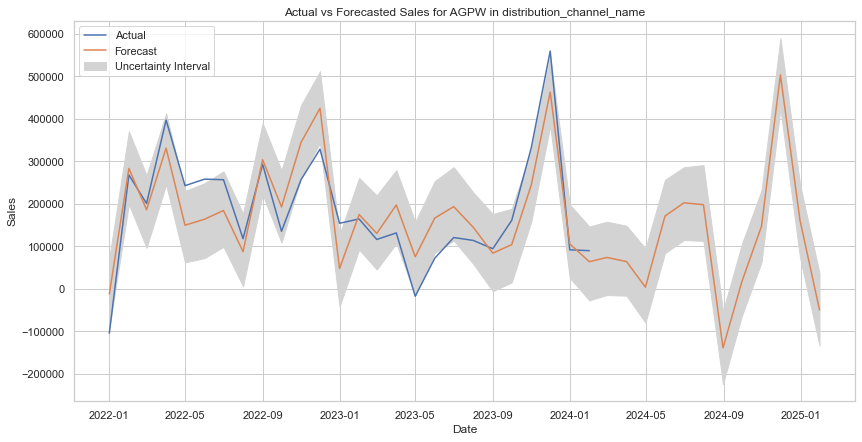

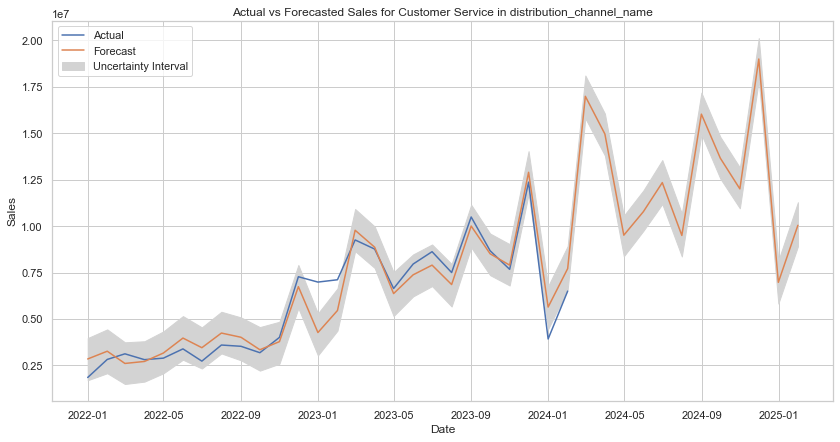

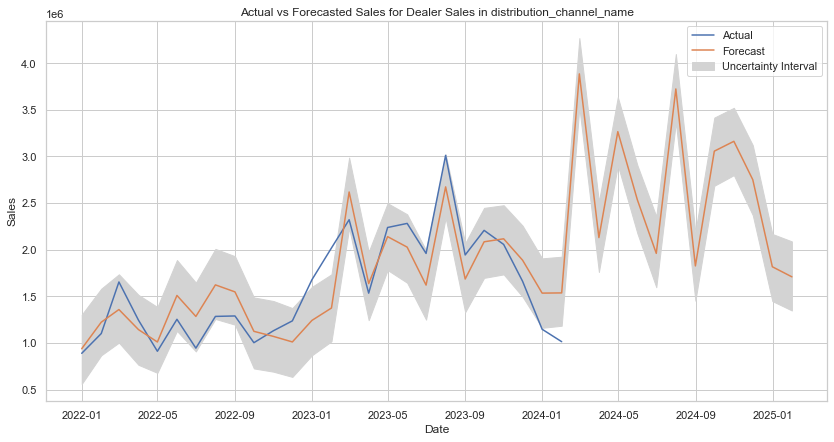

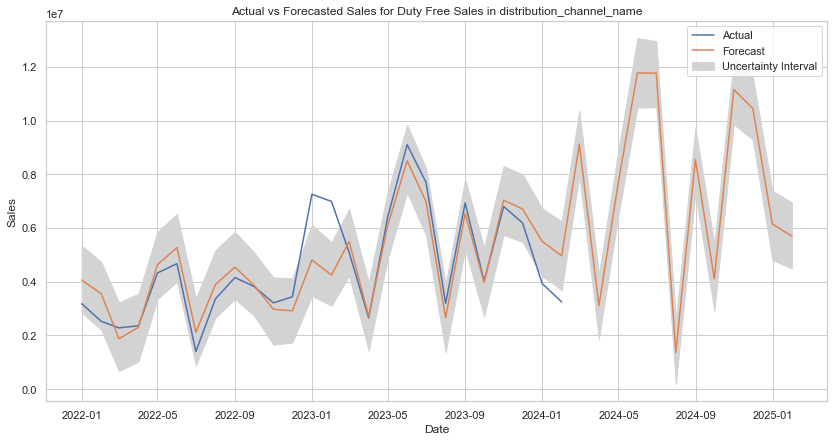

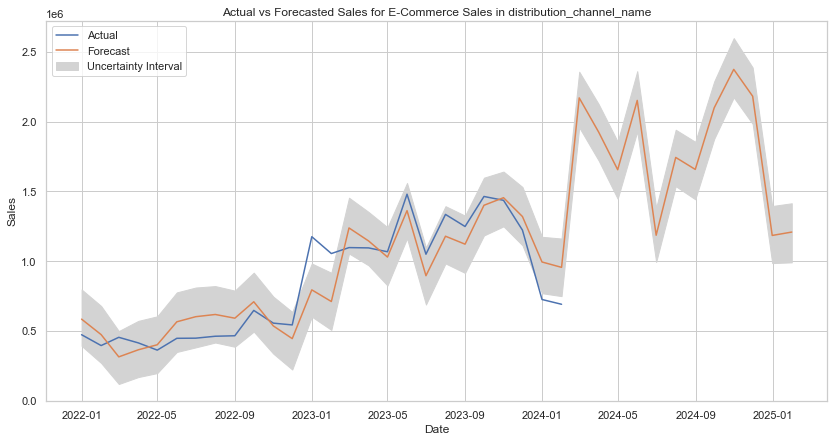

...

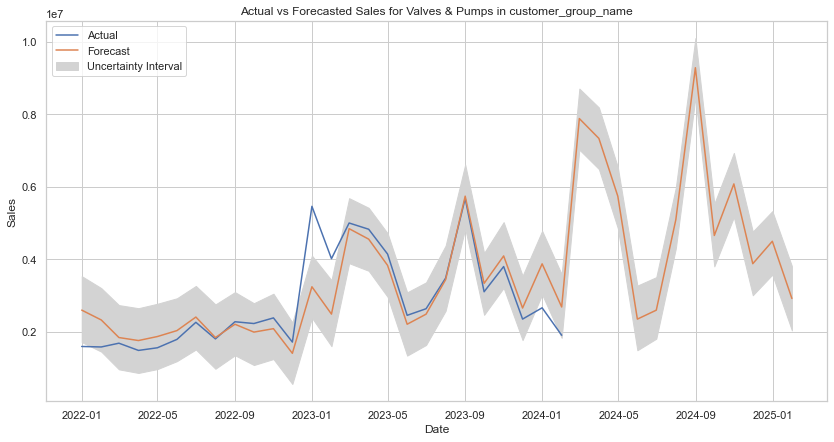

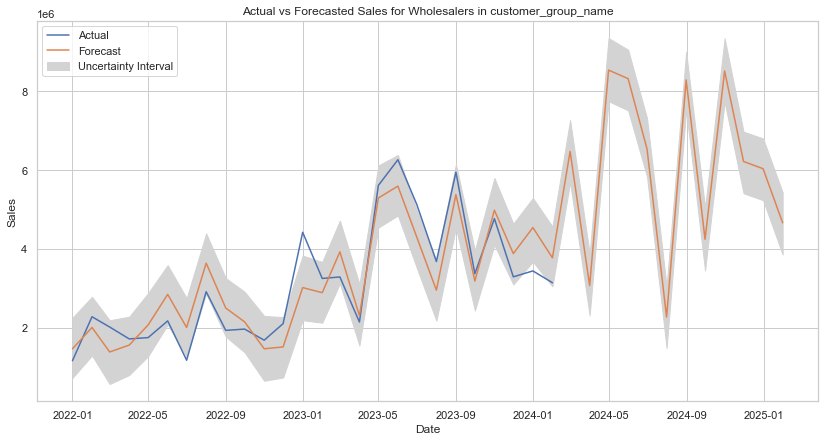

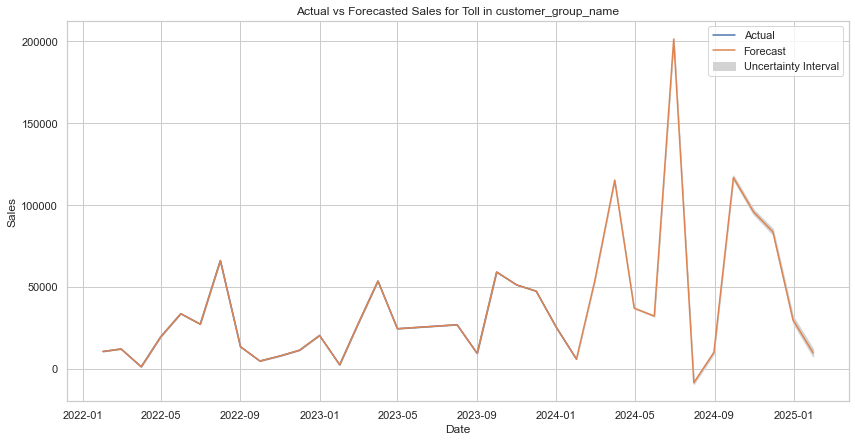

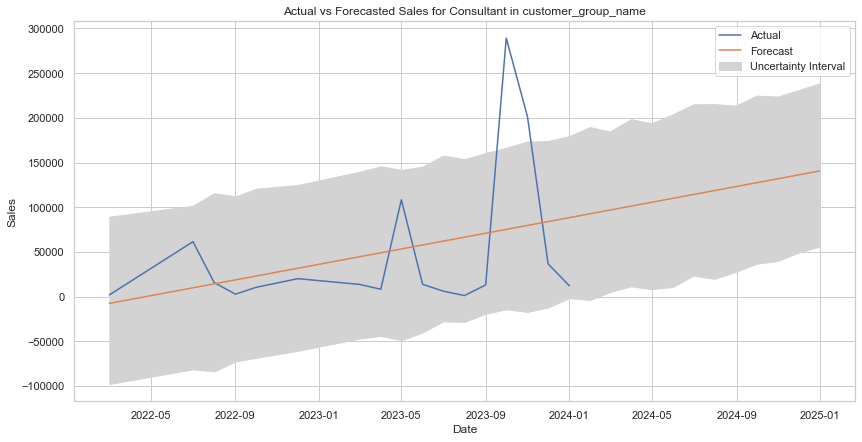

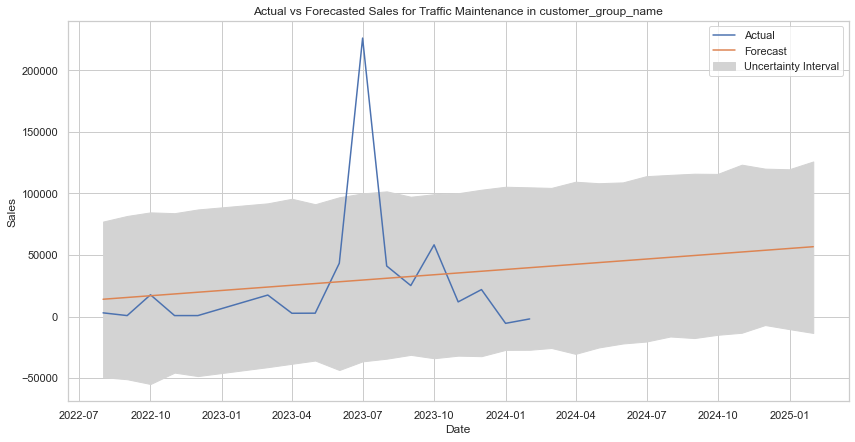

In [21]:
# Function to plot actual and forecasted data for a category within a dimension
def plot_actual_vs_forecast(data, forecast, dimension, category):
    plt.figure(figsize=(14, 7))
    plt.plot(data['ds'], data['y'], label='Actual')
    plt.plot(forecast['ds'], forecast['yhat'], label='Forecast')
    plt.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], color='lightgray', label='Uncertainty Interval')
    plt.title(f'Actual vs Forecasted Sales for {category} in {dimension}')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()

# Plot actual and forecasted data for each category within each dimension
for dim, forecast_results in forecast_results_by_dimension.items():
    for category, forecast in forecast_results.items():
        if category not in low_accuracy_categories_by_dimension[dim]:
            category_data = filtered_data_by_dimension[dim][filtered_data_by_dimension[dim][dim] == category][['fiscal_period', 'actual_income_data']].rename(columns={'fiscal_period': 'ds', 'actual_income_data': 'y'})
            plot_actual_vs_forecast(category_data, forecast, dim, category)
